In [1]:
from xgboost import XGBClassifier
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, plot_confusion_matrix, confusion_matrix
import yaml
from yaml.loader import SafeLoader
from sklearn.metrics import f1_score, make_scorer, roc_auc_score, precision_score, fbeta_score
import seaborn as sns
import plotly.express as px
import plotly.offline as pyo

In [2]:
fbeta = make_scorer(fbeta_score, beta=.4)

In [3]:
with open('../config.yaml','r') as config:
    conf = yaml.load(config, SafeLoader)
    RANDOM_STATE= conf['random_state']

In [4]:
df = pd.read_csv('../data/df_sin_duplicados.csv')
X  = df.drop(columns='label')
y  = df['label']

Holdout

In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=RANDOM_STATE, stratify=y)

------

# Experimento 1
Datos sin reducción de dimensionalidad ni feature engeneering

In [6]:
parameters = {
  'n_estimators':[100, 300, 500],
  'max_depth':[3, 4, 6,8,10],
  'max_bin':[5,10,15],
  'eta':[.1,.3,.5],
  'gamma':[.1,.2,.5],
  'colsample_bynode':[1,.8],
  'lambda':[0,.5,1,3],
  'grow_policy':['depthwise'],
  'objective':['reg:logistic','reg:squaredlogerror'],
  'random_state':[RANDOM_STATE],
  'colsample_bynode':[.8,.9]
  }

In [7]:
xgb = XGBClassifier()

In [8]:
grid_pipeline1 = RandomizedSearchCV(xgb, parameters, n_iter=100, cv=5, random_state=RANDOM_STATE, verbose=1, scoring=fbeta)

In [10]:
grid_pipeline1.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, gamma=None,
                                           gpu_id=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None, max_bin=None,...
                   param_distributions={'colsample_bynode': [0.8, 0.9],
                                        'eta': [0.1, 0.3, 0.5],
                                        'gamma': [0.1, 0.2, 0.5],
                                        'grow_policy': ['depthwise'],
                                        'lambda': [0, 0.5, 1, 3],
                                        'max_bin': [5, 10, 15],
                                        'max_depth': [3, 4, 6, 8, 10],
                                        'n_estimators': [100, 300, 500],
                                        'objective': ['reg:logistic',
                                                      'reg:squaredlogerror'],
                                        'random_state': [1203]},
                   random_state=1203,
                   scoring=make_scorer(fbeta_score, beta=0.4), verbose=1)

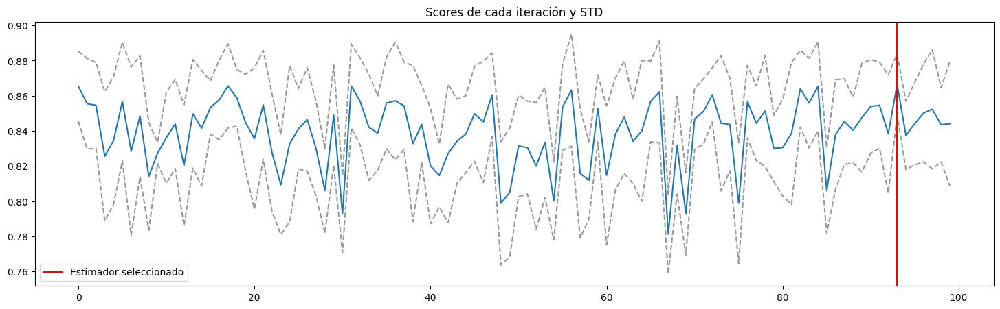

In [11]:
plt.figure(figsize=(18,5))
test_score = grid_pipeline1.cv_results_['mean_test_score']
std_score  = grid_pipeline1.cv_results_['std_test_score']
top_estimator = np.where(grid_pipeline1.cv_results_['rank_test_score']==1, 1, 0)
sns.lineplot(test_score)
sns.lineplot(test_score+std_score, color='black', ls='--',alpha=.4)
sns.lineplot(test_score-std_score, color='black', ls='--',alpha=.4)
plt.axvline(np.argmax(test_score*top_estimator), 0, 1, color='red', label='Estimador seleccionado')
plt.title('Scores de cada iteración y STD')
plt.legend();

In [12]:
from auxiliar import threshold_optimization
skf = StratifiedKFold()
result, top_threshold1 = threshold_optimization( X_train,
                                                y_train,
                                                grid_pipeline1.best_estimator_,
                                                skf)
result.head(1)

,trheshold,fbeta_score,recall_score,precision_score
6,0.51,0.98702,0.960877,0.993985


In [13]:
y_hat = grid_pipeline1.predict_proba(X_test)

In [14]:
y_hat = np.where(y_hat[:,1]>top_threshold1, 1, 0)

In [15]:
print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

           0       0.75      0.86      0.80        73
           1       0.90      0.81      0.85       111

    accuracy                           0.83       184
   macro avg       0.82      0.84      0.83       184
weighted avg       0.84      0.83      0.83       184



In [16]:
from auxiliar import plot_matriz_confusion

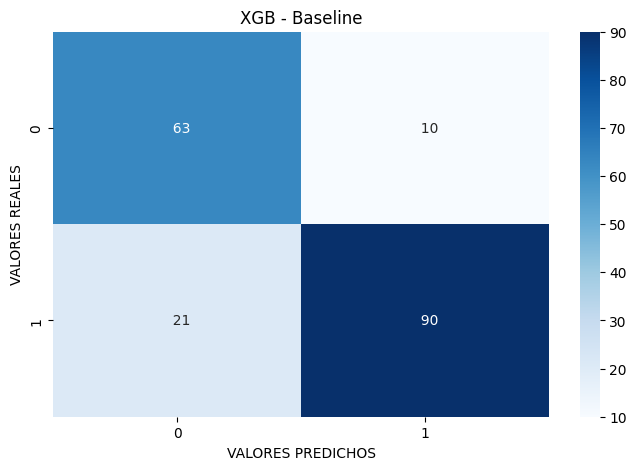

In [17]:
plot_matriz_confusion(y_test, y_hat, 'XGB - Baseline')

### Error analysis
Dónde estamos errando?

In [18]:
analysis = X_test.copy()
pca_for_analysis = PCA(n_components=3)
analysis = pd.DataFrame(pca_for_analysis.fit_transform(analysis),columns=['pc1','pc2','pc3'])

In [19]:
analysis['y_true'] = y_test.copy().values
analysis['y_hat']  = y_hat
analysis['errors'] = analysis.y_hat - analysis.y_true

In [20]:
pyo.init_notebook_mode()
fig = px.scatter_3d(
    analysis,
    x=analysis.columns[0],
    y=analysis.columns[1],
    z=analysis.columns[2],
    color="errors",
    title="Experimento 1 - Error analysis",
    width=700,
    height=600,
)
fig.show()

----

# Experimento 2
Datos con feateng 

In [21]:
df = pd.read_csv('../data/df_sin_duplicados.csv')
X  = df.drop(columns='label')
y  = df['label']

Holdout

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=RANDOM_STATE, stratify=y)

In [23]:
parameters = {
  'xgb__n_estimators':[100,300,500, 700],
  'xgb__max_depth':[4, 6, 8,10],
  'xgb__max_bin':[5,10,15],
  'xgb__eta':[.1,.3,.5],
  'xgb__gamma':[0,1,2,5],
  'xgb__colsample_bynode':[1,.8],
  'xgb__lambda':[0,.5,1,3],
  'xgb__tree_method':['approx','exact'],
  'xgb__objective':['reg:logistic','reg:squaredlogerror'],
  'xgb__random_state':[RANDOM_STATE]
  }

In [24]:
from auxiliar import AuxTargetEncoding

In [25]:
pipeline = Pipeline([( "LE" , AuxTargetEncoding()),
                       ("xgb", XGBClassifier())])

In [26]:
grid_pipeline2 = RandomizedSearchCV(pipeline, parameters, n_iter=100, cv=5, random_state=RANDOM_STATE, verbose=1, scoring=fbeta)

In [27]:
grid_pipeline2.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('LE', AuxTargetEncoding()),
                                             ('xgb',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            colsample_bylevel=None,
                                                            colsample_bynode=None,
                                                            colsample_bytree=None,
                                                            early_stopping_rounds=None,
                                                            enable_categorical=False,
                                                            eval_metric=None,
                                                            gamma=None,
                                                            gpu_id=None,
                                                            grow_policy=None,
                                                            importance_type=None,
                                                            interaction...
                                        'xgb__eta': [0.1, 0.3, 0.5],
                                        'xgb__gamma': [0, 1, 2, 5],
                                        'xgb__lambda': [0, 0.5, 1, 3],
                                        'xgb__max_bin': [5, 10, 15],
                                        'xgb__max_depth': [4, 6, 8, 10],
                                        'xgb__n_estimators': [100, 300, 500,
                                                              700],
                                        'xgb__objective': ['reg:logistic',
                                                           'reg:squaredlogerror'],
                                        'xgb__random_state': [1203],
                                        'xgb__tree_method': ['approx',
                                                             'exact']},
                   random_state=1203,
                   scoring=make_scorer(fbeta_score, beta=0.4), verbose=1)

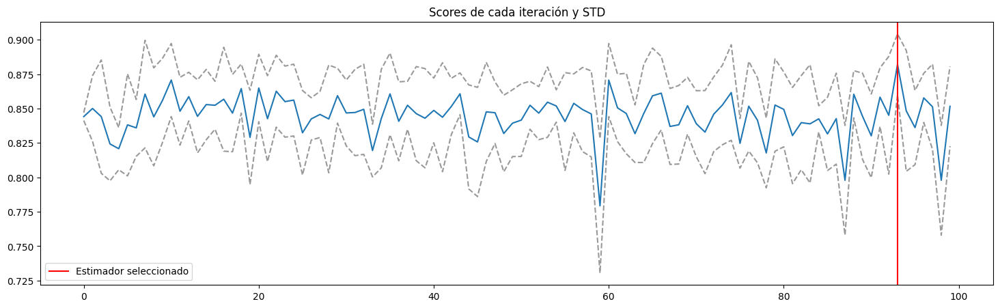

In [28]:
plt.figure(figsize=(18,5))
test_score = grid_pipeline2.cv_results_['mean_test_score']
std_score  = grid_pipeline2.cv_results_['std_test_score']
top_estimator = np.where(grid_pipeline2.cv_results_['rank_test_score']==1, 1, 0)
sns.lineplot(test_score)
sns.lineplot(test_score+std_score, color='black', ls='--',alpha=.4)
sns.lineplot(test_score-std_score, color='black', ls='--',alpha=.4)
plt.axvline(np.argmax(test_score*top_estimator), 0, 1, color='red', label='Estimador seleccionado')
plt.title('Scores de cada iteración y STD')
plt.legend();

Test

In [29]:
from auxiliar import threshold_optimization
skf = StratifiedKFold()
result, top_threshold2 = threshold_optimization( X_train,
                                                y_train,
                                                grid_pipeline2.best_estimator_,
                                                skf,
                                                min_aceptable_recall=.8)
result.head(1)

,trheshold,fbeta_score,recall_score,precision_score
9,0.54,0.888211,0.828494,0.905069


In [30]:
y_hat = grid_pipeline2.predict_proba(X_test)

In [31]:
y_hat = np.where(y_hat[:,1]>top_threshold2, 1, 0)

In [32]:
print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

           0       0.71      0.81      0.76        73
           1       0.86      0.78      0.82       111

    accuracy                           0.79       184
   macro avg       0.79      0.80      0.79       184
weighted avg       0.80      0.79      0.80       184



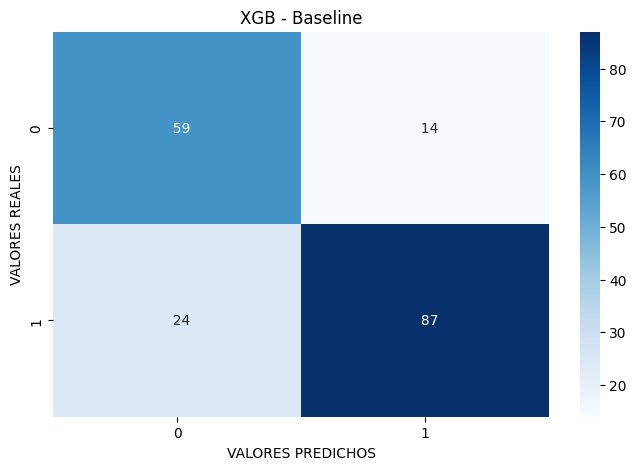

In [33]:
plot_matriz_confusion(y_test, y_hat, 'XGB - AuxTargetEncoding')

In [34]:
analysis = X_test.copy()
pca_for_analysis = PCA(n_components=3)
analysis = pd.DataFrame(pca_for_analysis.fit_transform(analysis),columns=['pc1','pc2','pc3'])

In [35]:
analysis['y_true'] = y_test.copy().values
analysis['y_hat']  = y_hat
analysis['errors'] = analysis.y_hat - analysis.y_true

In [36]:
pyo.init_notebook_mode()
fig = px.scatter_3d(
    analysis,
    x=analysis.columns[0],
    y=analysis.columns[1],
    z=analysis.columns[2],
    color="errors",
    title="Experimento 3 - Error analysis",
    width=700,
    height=600,
)
fig.show()

In [37]:
feat_importance = pd.DataFrame(grid_pipeline2.best_estimator_[1].feature_importances_, columns=['score'])
feat_importance['feat'] = grid_pipeline2.best_estimator_[0].columns
feat_importance.sort_values(by='score',ascending=False)

,score,feat
38,0.414169,speechiness_vs_TE_label1
31,0.309179,loudness_vs_TE_label0
2,0.276652,acousticness_vs_TE_label1
0,0.000000,TE_acousticness_label_1
28,0.000000,TE_loudness_label_1
29,0.000000,TE_loudness_label_0
30,0.000000,loudness_vs_TE_label1
32,0.000000,TE_mode_label_1
33,0.000000,TE_mode_label_0
34,0.000000,mode_vs_TE_label1


In [39]:
aux = AuxTargetEncoding()
df_fe = aux.fit_transform(df.drop(columns=['label']), df.label)
analysis = df_fe.copy()
analysis['label'] = pd.concat([y_train, y_test])

In [40]:
pyo.init_notebook_mode()
fig = px.scatter_3d(
    analysis,
    x='speechiness_vs_TE_label0',
    y='acousticness_vs_TE_label0',
    z='loudness_vs_TE_label0',
    color="label",
    title="Experimento 2 - Error analysis",
    width=700,
    height=600,
)
fig.show()

---

# Experimento 3
Datos con feateng 2

In [41]:
from auxiliar import AuxTargetEncodingNoDrop

In [42]:
df = pd.read_csv('../data/df_sin_duplicados.csv')
X  = df.drop(columns='label')
y  = df['label']

Holdout

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state=RANDOM_STATE, stratify=y)

In [44]:
pipeline = Pipeline([( "LE" , AuxTargetEncodingNoDrop()),
                       ("xgb", XGBClassifier())])

In [45]:
grid_pipeline3 = RandomizedSearchCV(pipeline, parameters, n_iter=100, cv=5, random_state=RANDOM_STATE, verbose=1, scoring=fbeta)

In [46]:
grid_pipeline3.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('LE', AuxTargetEncodingNoDrop()),
                                             ('xgb',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            colsample_bylevel=None,
                                                            colsample_bynode=None,
                                                            colsample_bytree=None,
                                                            early_stopping_rounds=None,
                                                            enable_categorical=False,
                                                            eval_metric=None,
                                                            gamma=None,
                                                            gpu_id=None,
                                                            grow_policy=None,
                                                            importance_type=None,
                                                            inter...
                                        'xgb__eta': [0.1, 0.3, 0.5],
                                        'xgb__gamma': [0, 1, 2, 5],
                                        'xgb__lambda': [0, 0.5, 1, 3],
                                        'xgb__max_bin': [5, 10, 15],
                                        'xgb__max_depth': [4, 6, 8, 10],
                                        'xgb__n_estimators': [100, 300, 500,
                                                              700],
                                        'xgb__objective': ['reg:logistic',
                                                           'reg:squaredlogerror'],
                                        'xgb__random_state': [1203],
                                        'xgb__tree_method': ['approx',
                                                             'exact']},
                   random_state=1203,
                   scoring=make_scorer(fbeta_score, beta=0.4), verbose=1)

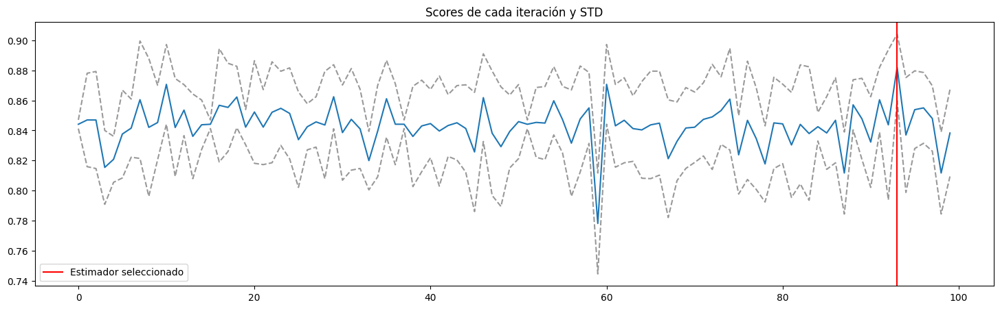

In [47]:
plt.figure(figsize=(18,5))
test_score = grid_pipeline3.cv_results_['mean_test_score']
std_score  = grid_pipeline3.cv_results_['std_test_score']
top_estimator = np.where(grid_pipeline3.cv_results_['rank_test_score']==1, 1, 0)
sns.lineplot(test_score)
sns.lineplot(test_score+std_score, color='black', ls='--',alpha=.4)
sns.lineplot(test_score-std_score, color='black', ls='--',alpha=.4)
plt.axvline(np.argmax(test_score*top_estimator), 0, 1, color='red', label='Estimador seleccionado')
plt.title('Scores de cada iteración y STD')
plt.legend();

In [48]:
from auxiliar import threshold_optimization
skf = StratifiedKFold()
result, top_threshold3 = threshold_optimization( X_train,
                                                y_train,
                                                grid_pipeline3.best_estimator_,
                                                skf,
                                                min_aceptable_recall=.8)
result.head(1)

,trheshold,fbeta_score,recall_score,precision_score
9,0.54,0.888211,0.828494,0.905069


In [49]:
y_hat = grid_pipeline3.predict_proba(X_test)

In [50]:
y_hat = np.where(y_hat[:,1]>top_threshold3, 1, 0)

In [51]:
print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

           0       0.71      0.81      0.76        73
           1       0.86      0.78      0.82       111

    accuracy                           0.79       184
   macro avg       0.79      0.80      0.79       184
weighted avg       0.80      0.79      0.80       184



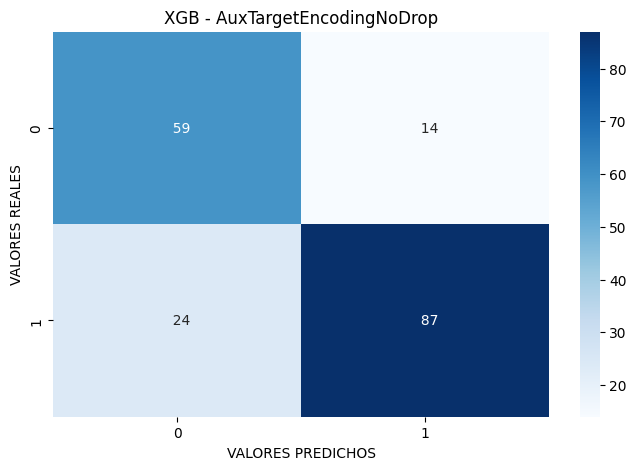

In [52]:
plot_matriz_confusion(y_test, y_hat, 'XGB - AuxTargetEncodingNoDrop')

---

Guardamos errores para contrastar con otros modelos

In [53]:
top_performer = grid_pipeline1
top_threshold = top_threshold1

In [54]:
y_hat = top_performer.best_estimator_.predict_proba(X_test)
y_hat = np.where(y_hat[:,1]>top_threshold, 1, 0)
analysis = X_test.copy()
analysis['y_true'] = y_test.copy().values
analysis['y_hat']  = y_hat
analysis['errors'] = analysis.y_hat - analysis.y_true

errores = analysis[analysis['errors']<0].index
aciertos = analysis[analysis['errors']==0].index

In [55]:
from auxiliar import guardar_errores, guardar_metricas, guardar_aciertos

In [56]:
guardar_errores('xgb',errores.values)
guardar_metricas('xgb',y_test, y_hat)
guardar_aciertos('xgb',aciertos.values)

----

# Guardamos top performer

In [57]:
import pickle

In [58]:
pickle.dump({'model':top_performer,'threshold':top_threshold}, open(f'../models/xgb.pkl','wb'))